In [1]:
from PIL import Image
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import copy
import time
import re
from keras.models import Model, model_from_json
from keras.optimizers import RMSprop
import glob
from coins_utils import *

#input information to explores
InputFolder = "CandidateDataSet2/RAW/mix/" # Here I store the input images
#InputFolder = "WhiteBackground/" # Here I store the input images
CoinsOutputFolder = "CandidateDataSet2/Processed_RAW/mix/" # Here I store the pictures of individual coins
CirclesOutputFolder = "CandidateDataSet2/Circles_RAW/mix/" # Here I store the pictures of individual coins


Using TensorFlow backend.


# Identifying the coins using the trained CNNs

Loaded model Model_Example_Coin_Classifier_Standard from disk 

Loaded model Model_Example_Coin_Classifier_BigCoins_Standard from disk 

Loaded model Model_Example_Coin_Classifier_GoldenCoins_Deep_30p_dropout025 from disk 

Loaded model Model_Example_Coin_Classifier_SmallCoins_Reduced from disk 

Analyzing input image CandidateDataSet2/RAW/mix/P70216-161000.jpg


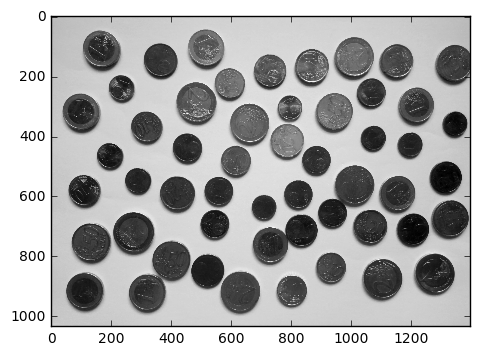

(1034, 1397, 3)


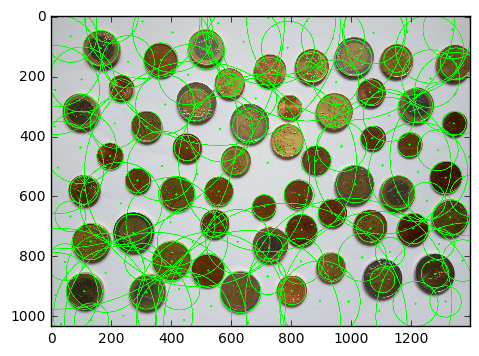

Total number of circles 52
(1034, 1397, 3)


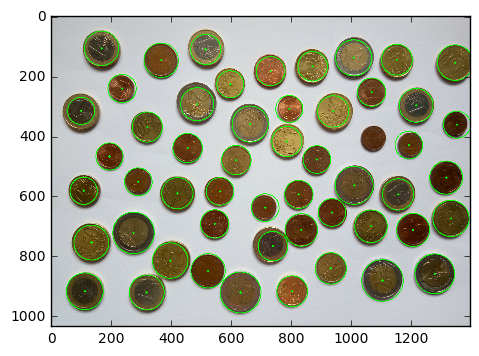

[274 724  69]
635 813 185 363


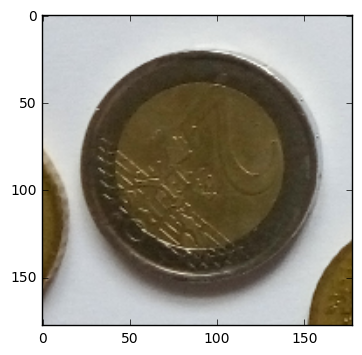

[1276  860   66]
775 945 1191 1361


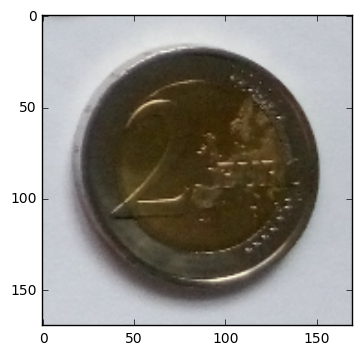

[1006  142   60]
64 220 928 1084


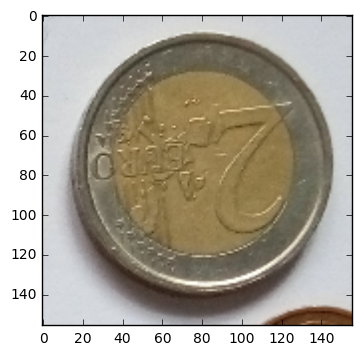

[112 918  61]
839 997 33 191


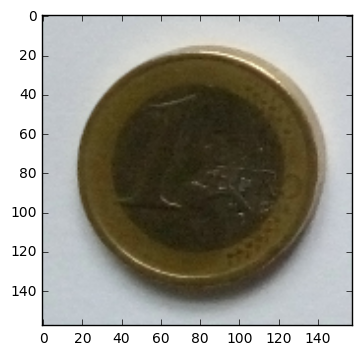

[318 922  58]
847 997 243 393


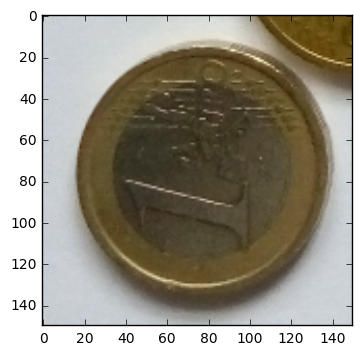

[168 110  57]
36 184 94 242


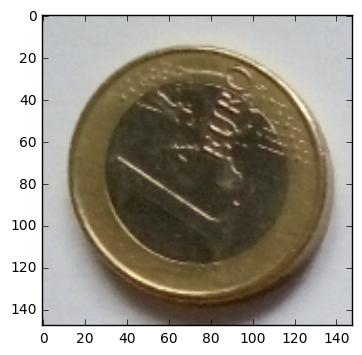

[134 756  58]
681 831 59 209


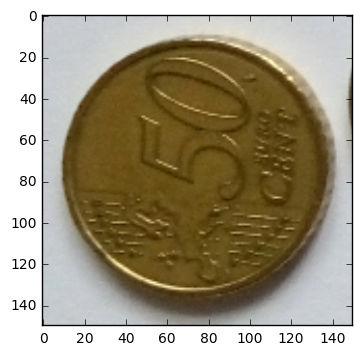

[100 318  45]
260 376 42 158


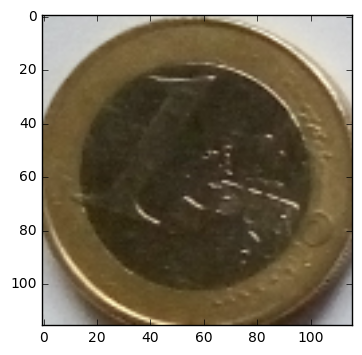

[662 362  60]
284 440 584 740


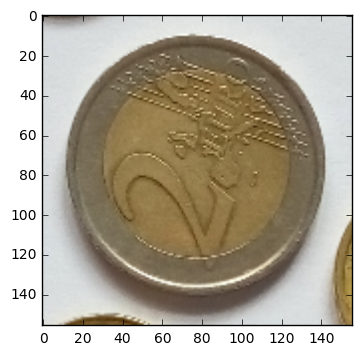

[1154  596   52]
529 663 1087 1221


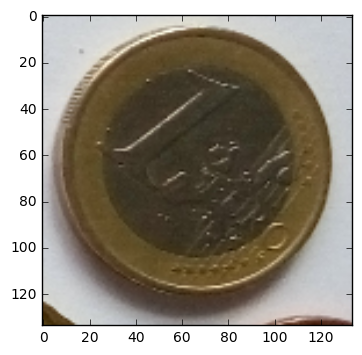

[1150  148   51]
82 214 1084 1216


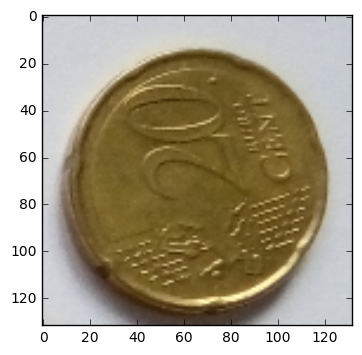

[870 170  49]
107 233 807 933


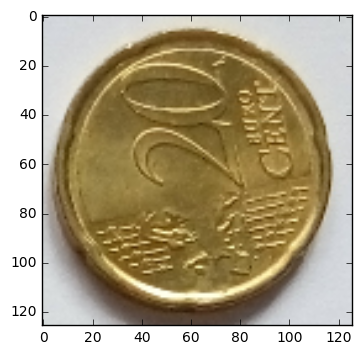

[1330  676   60]
598 754 1252 1397


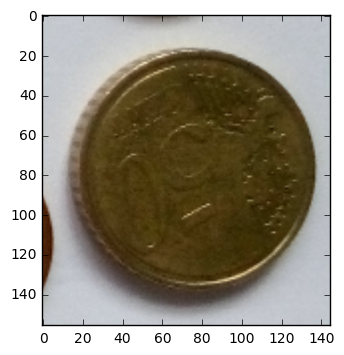

[396 816  59]
740 892 320 472


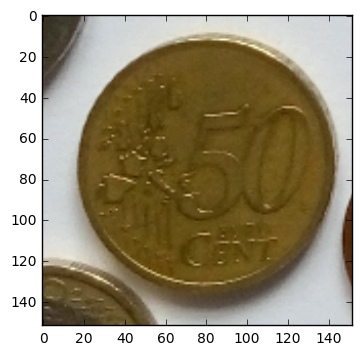

[1102  882   69]
793 971 1013 1191


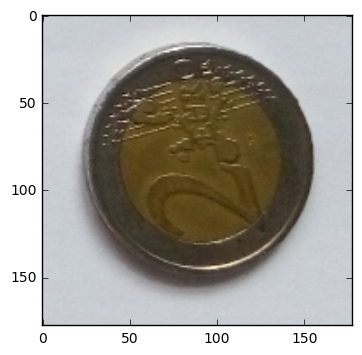

[486 296  55]
225 367 415 557


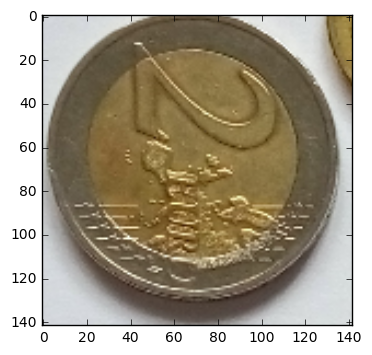

[1008  566   63]
485 647 927 1089


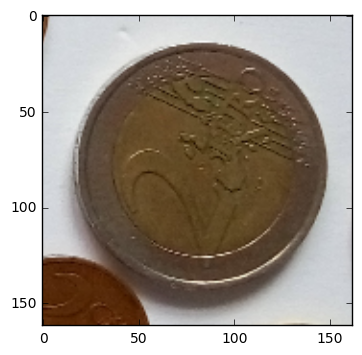

[1204  714   55]
643 785 1133 1275


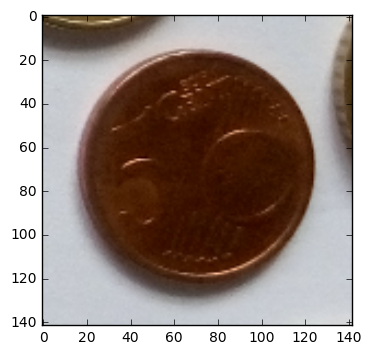

[630 922  68]
834 1010 542 718


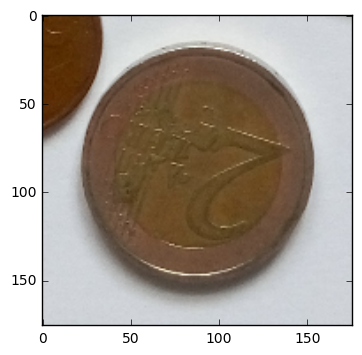

[1314  540   55]
469 611 1243 1385


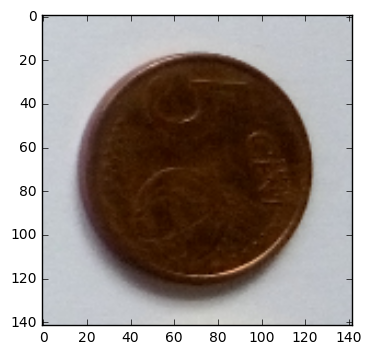

[1214  300   56]
228 372 1142 1286


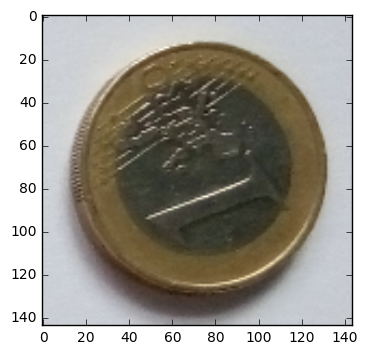

[514 114  50]
49 179 449 579


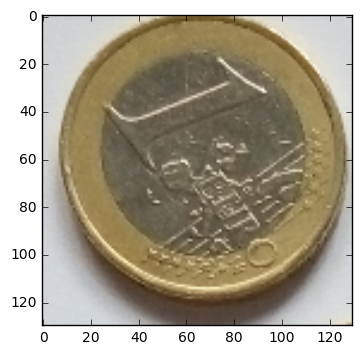

[366 150  57]
76 224 292 440


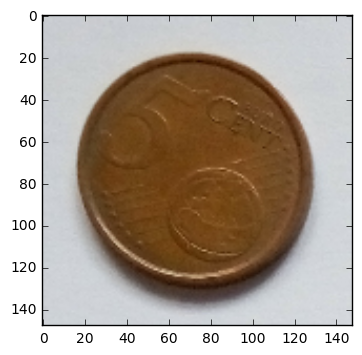

[1064  702   54]
632 772 994 1134


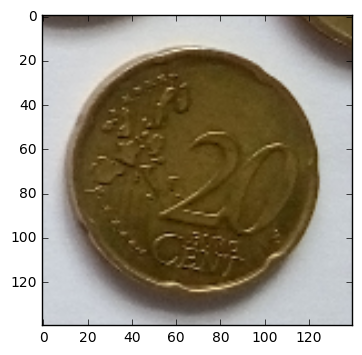

[832 714  54]
644 784 762 902


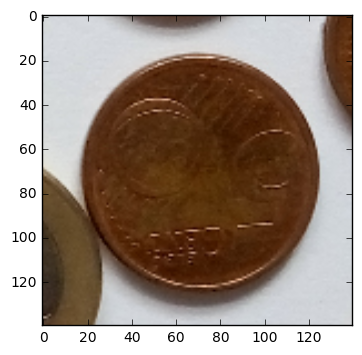

[938 320  52]
253 387 871 1005


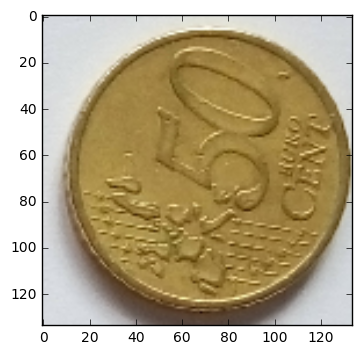

[420 592  52]
525 659 353 487


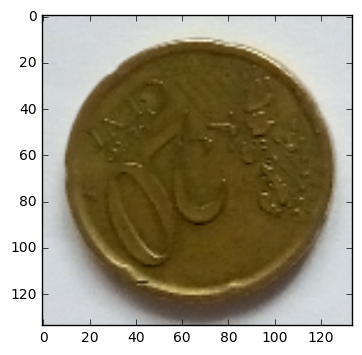

[730 186  48]
124 248 668 792


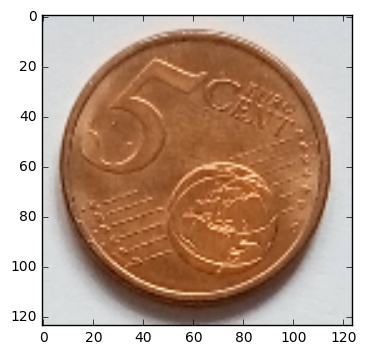

[454 442  49]
379 505 391 517


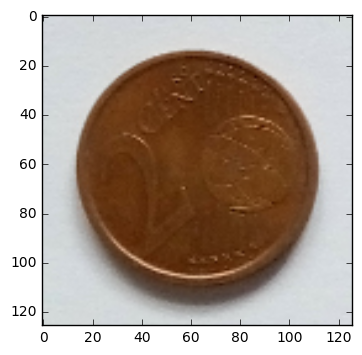

[784 420  50]
355 485 719 849


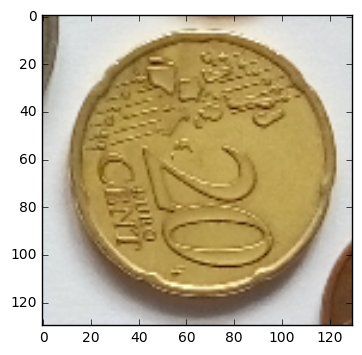

[562 586  46]
527 645 503 621


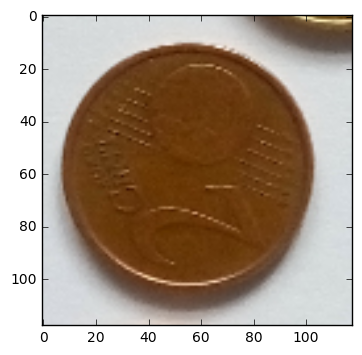

[522 850  57]
776 924 448 596


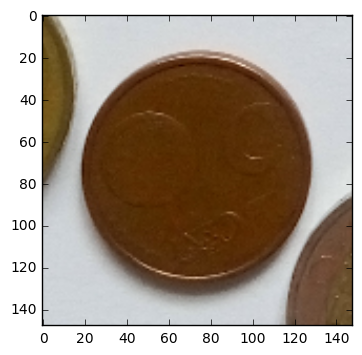

[1344  158   59]
82 234 1268 1397


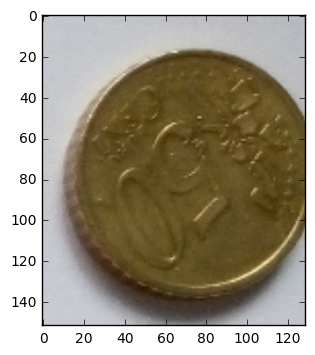

[108 584  45]
526 642 50 166


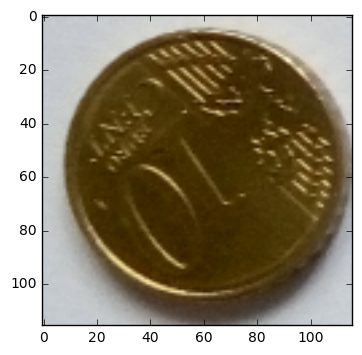

[738 768  49]
705 831 675 801


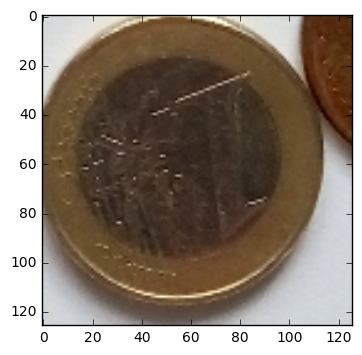

[320 372  50]
307 437 255 385


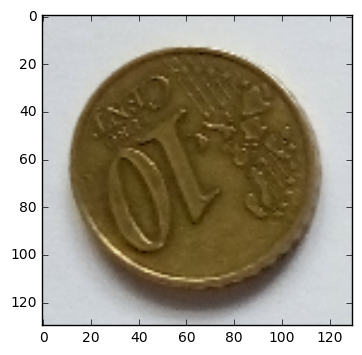

[930 842  52]
775 909 863 997


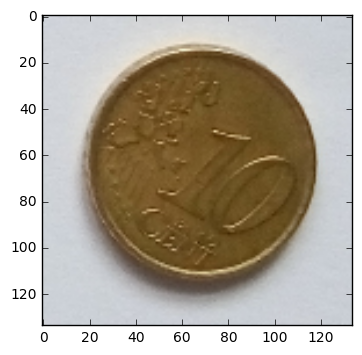

[1066  256   47]
195 317 1005 1127


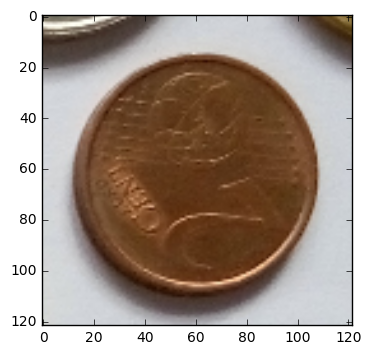

[934 656  46]
597 715 875 993


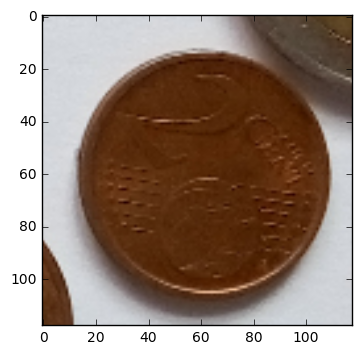

[544 694  47]
633 755 483 605


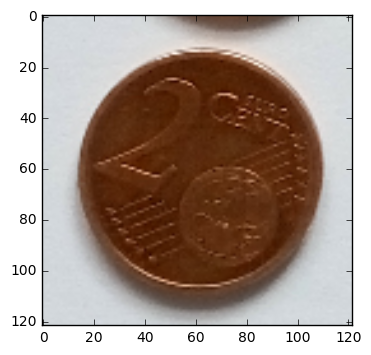

[596 230  45]
172 288 538 654


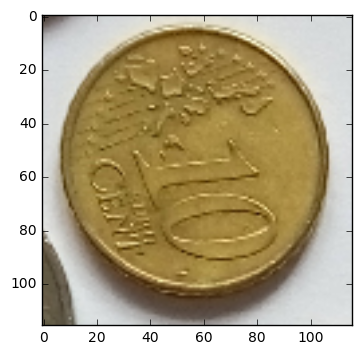

[616 482  49]
419 545 553 679


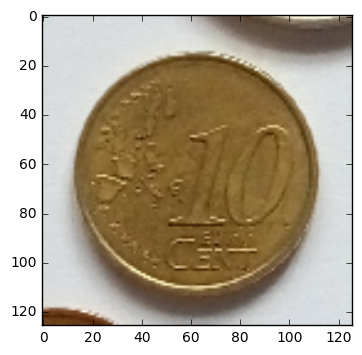

[824 596  47]
535 657 763 885


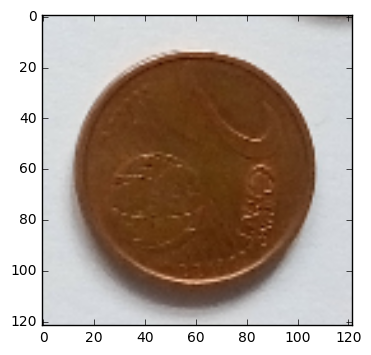

[884 480  46]
421 539 825 943


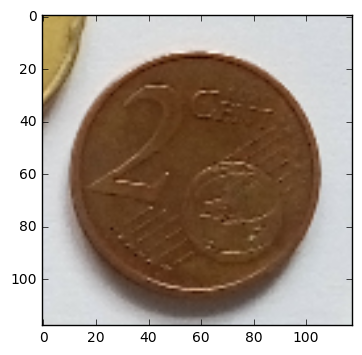

[802 918  51]
852 984 736 868


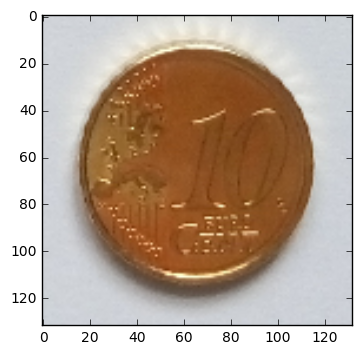

[194 470  45]
412 528 136 252


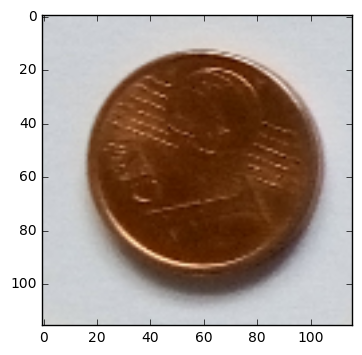

[792 312  45]
254 370 734 850


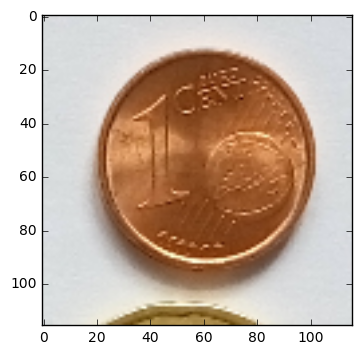

[290 554  46]
495 613 231 349


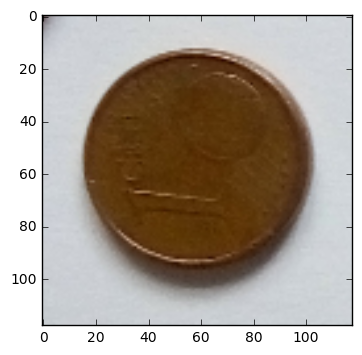

[1190  432   46]
373 491 1131 1249


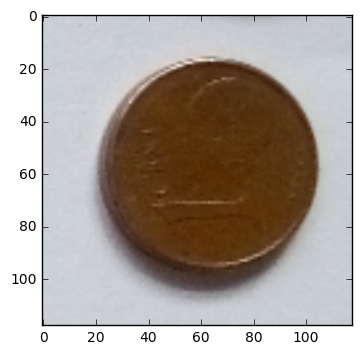

[236 244  47]
183 305 175 297


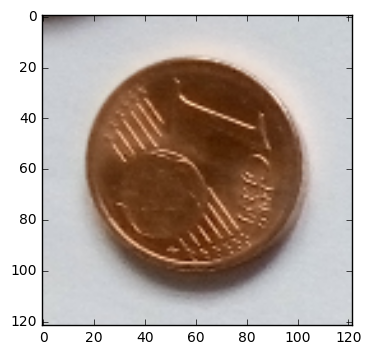

[1350  364   45]
306 422 1292 1397


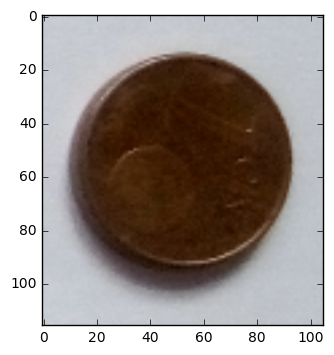

[712 640  46]
581 699 653 771


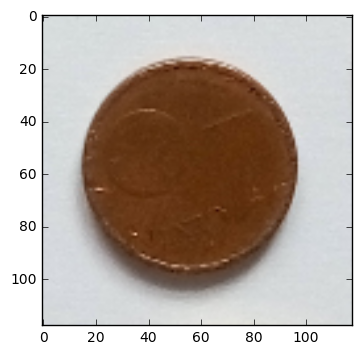

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



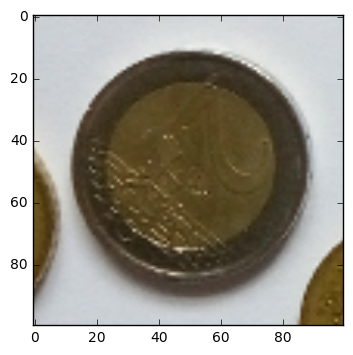

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



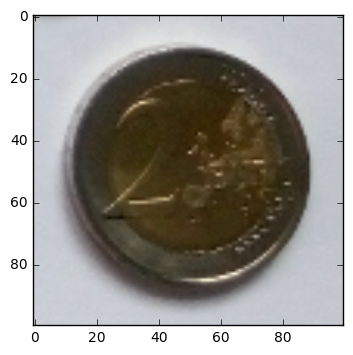

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



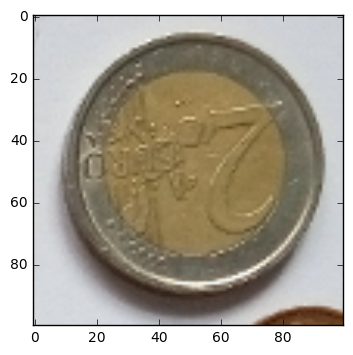

 0.00082378 of 10 cent 

 0.00141394 of 20 cent 

 0.84609944 of 50 cent 



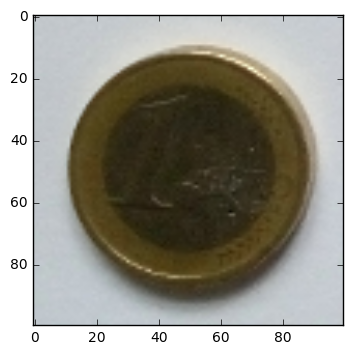

 0.91982430 of 1 euro 

 0.00000009 of 2 euro 



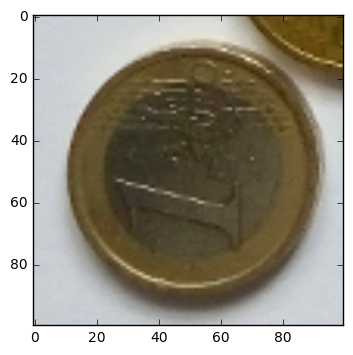

 0.92023236 of 1 euro 

 0.00000009 of 2 euro 



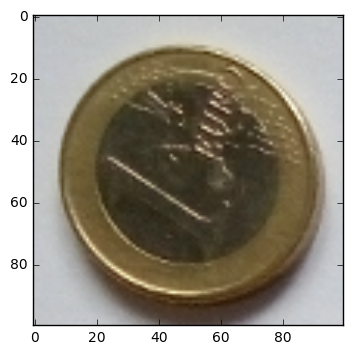

 0.00170067 of 10 cent 

 0.40802634 of 20 cent 

 0.16879517 of 50 cent 



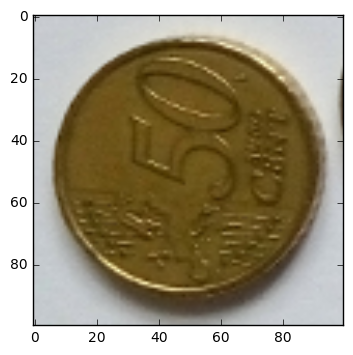

 0.00115114 of 10 cent 

 0.00183890 of 20 cent 

 0.90525156 of 50 cent 



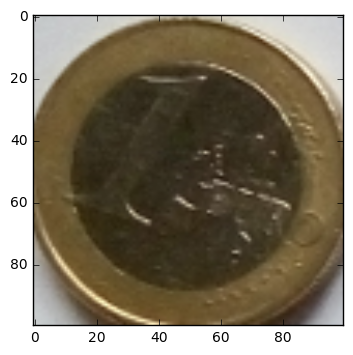

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



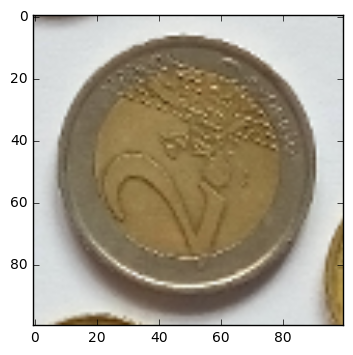

 0.92027676 of 1 euro 

 0.00000009 of 2 euro 



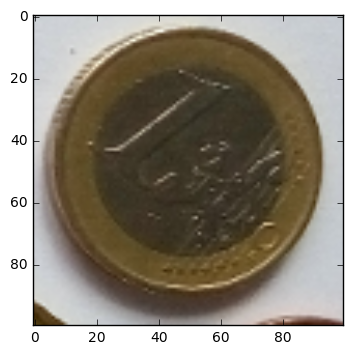

 0.00074531 of 10 cent 

 0.01636645 of 20 cent 

 0.36037943 of 50 cent 



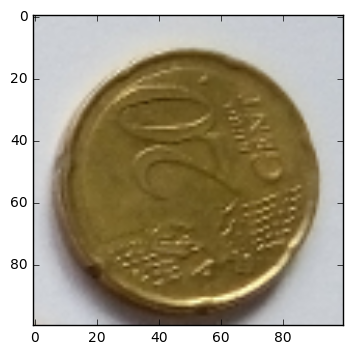

 0.00098502 of 10 cent 

 0.00134291 of 20 cent 

 0.85221398 of 50 cent 



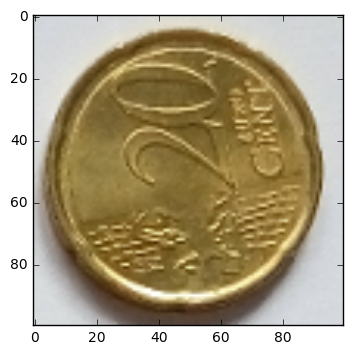

 0.00090296 of 10 cent 

 0.27211532 of 20 cent 

 0.18212651 of 50 cent 



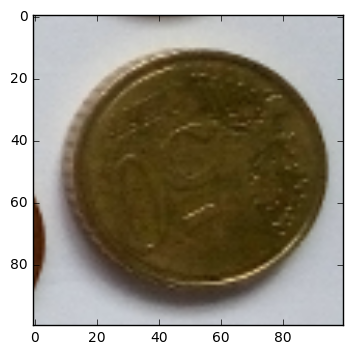

 0.00053622 of 10 cent 

 0.96796030 of 20 cent 

 0.10441332 of 50 cent 



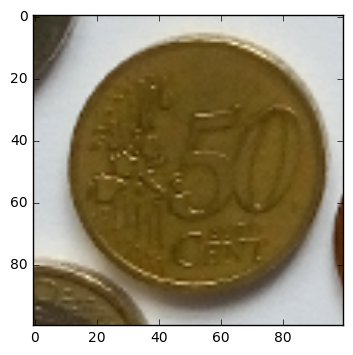

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



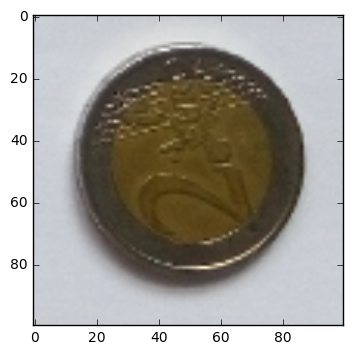

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



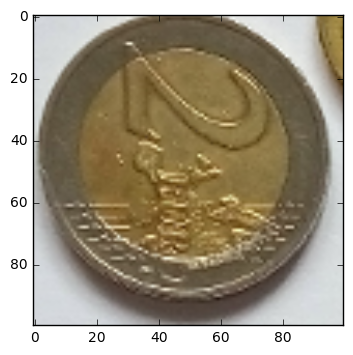

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



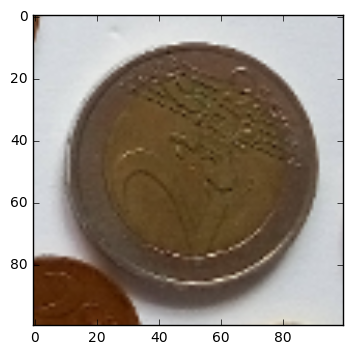

 0.00010026 of 1 cent 

 0.00017292 of 2 cent 

 0.97743499 of 5 cent 



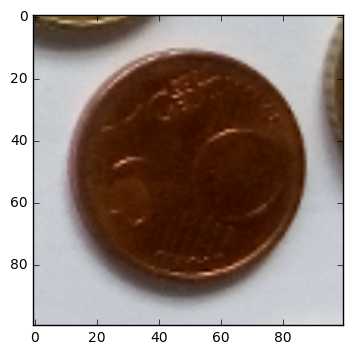

 0.00000009 of 1 euro 

 0.96852744 of 2 euro 



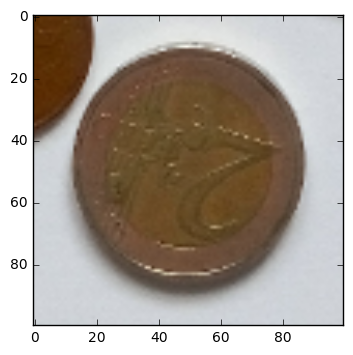

 0.00010027 of 1 cent 

 0.00017292 of 2 cent 

 0.97743475 of 5 cent 



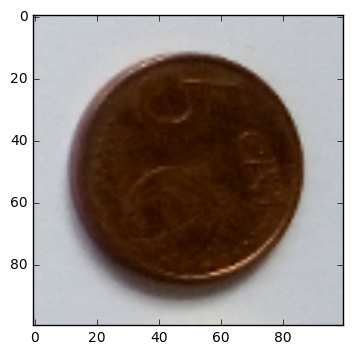

 0.92027766 of 1 euro 

 0.00000009 of 2 euro 



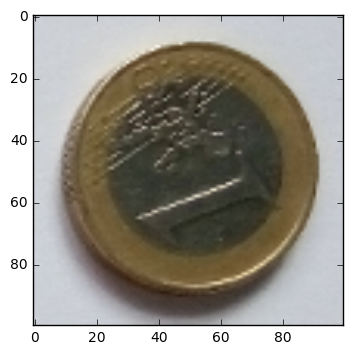

 0.92027777 of 1 euro 

 0.00000009 of 2 euro 



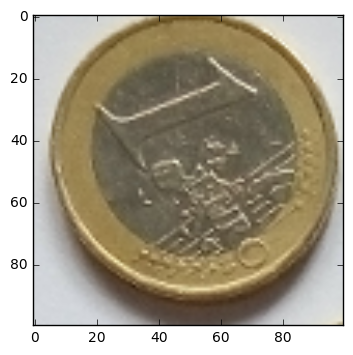

 0.00010038 of 1 cent 

 0.00017289 of 2 cent 

 0.97742724 of 5 cent 



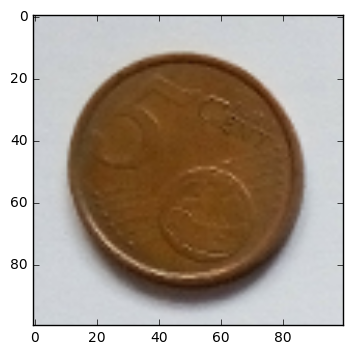

 0.00045681 of 10 cent 

 0.94102561 of 20 cent 

 0.15433955 of 50 cent 



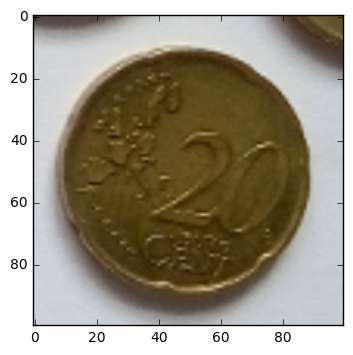

 0.00010035 of 1 cent 

 0.00017293 of 2 cent 

 0.97742677 of 5 cent 



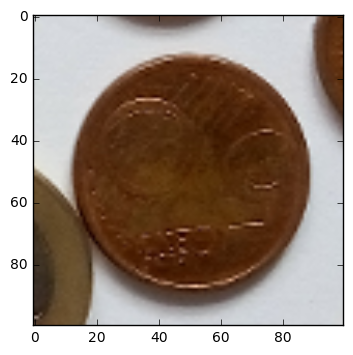

 0.00082581 of 10 cent 

 0.00135448 of 20 cent 

 0.89185631 of 50 cent 



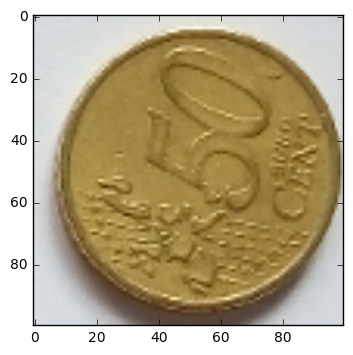

 0.00366533 of 10 cent 

 0.85528886 of 20 cent 

 0.06393115 of 50 cent 



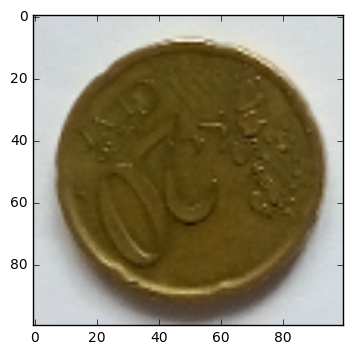

 0.00010027 of 1 cent 

 0.00017293 of 2 cent 

 0.97743386 of 5 cent 



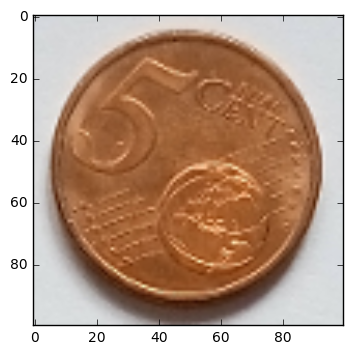

 0.00010026 of 1 cent 

 0.00017293 of 2 cent 

 0.97743487 of 5 cent 



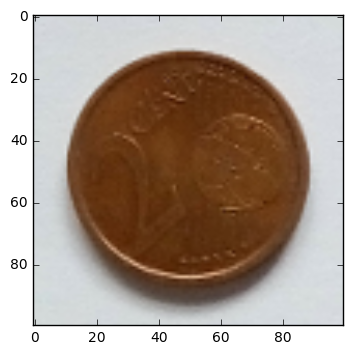

 0.00081593 of 10 cent 

 0.00122460 of 20 cent 

 0.88944942 of 50 cent 



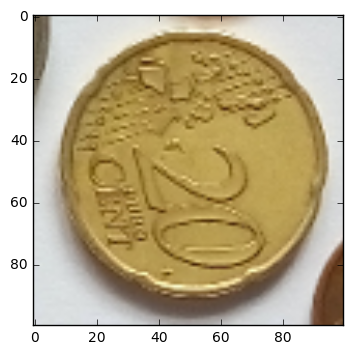

 0.00010025 of 1 cent 

 0.00017304 of 2 cent 

 0.97742623 of 5 cent 



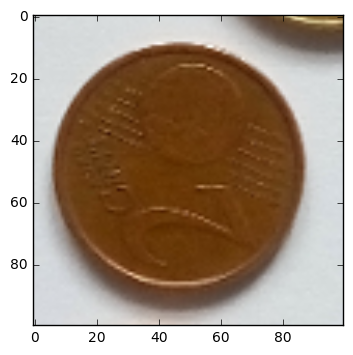

 0.00010026 of 1 cent 

 0.00017294 of 2 cent 

 0.97743440 of 5 cent 



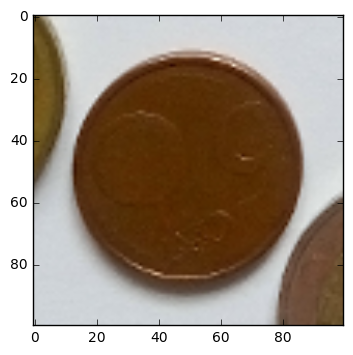

 0.00132190 of 10 cent 

 0.00709813 of 20 cent 

 0.32725400 of 50 cent 



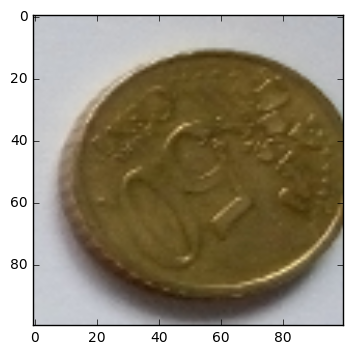

 0.00876935 of 10 cent 

 0.79152799 of 20 cent 

 0.08264770 of 50 cent 



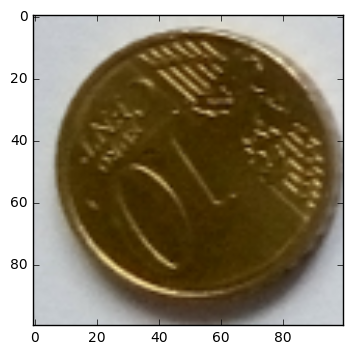

 0.92027748 of 1 euro 

 0.00000009 of 2 euro 



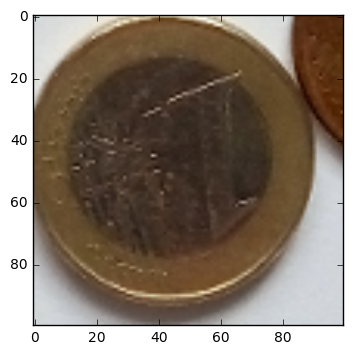

 0.00061569 of 10 cent 

 0.01394345 of 20 cent 

 0.36262736 of 50 cent 



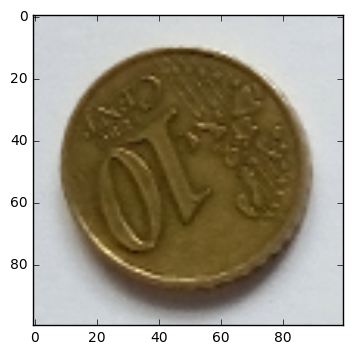

 0.00088709 of 10 cent 

 0.00175163 of 20 cent 

 0.74926168 of 50 cent 



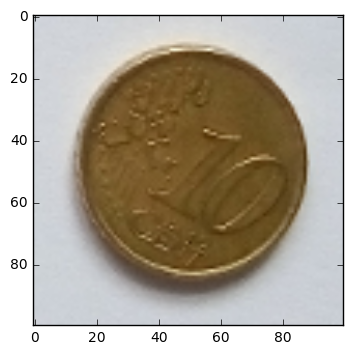

 0.00010026 of 1 cent 

 0.00017296 of 2 cent 

 0.97743213 of 5 cent 



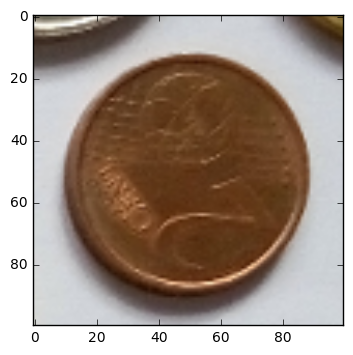

 0.00010028 of 1 cent 

 0.00017294 of 2 cent 

 0.97743165 of 5 cent 



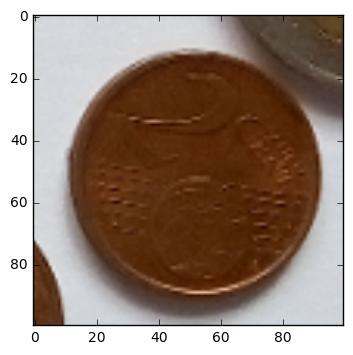

 0.00010045 of 1 cent 

 0.00017291 of 2 cent 

 0.97741622 of 5 cent 



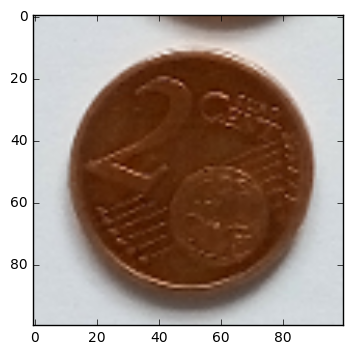

 0.00080073 of 10 cent 

 0.00137826 of 20 cent 

 0.84667295 of 50 cent 



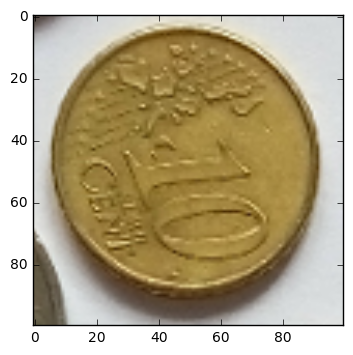

 0.00083303 of 10 cent 

 0.00146137 of 20 cent 

 0.85632336 of 50 cent 



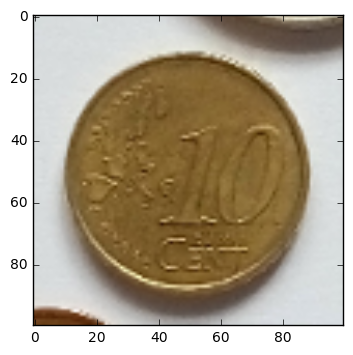

 0.00010041 of 1 cent 

 0.00017289 of 2 cent 

 0.97742349 of 5 cent 



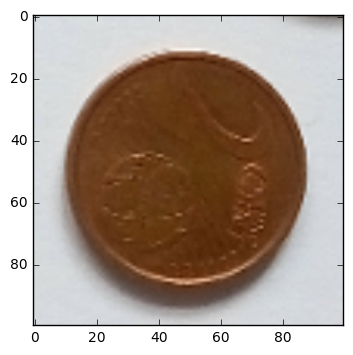

 0.00009998 of 1 cent 

 0.00017600 of 2 cent 

 0.97730017 of 5 cent 



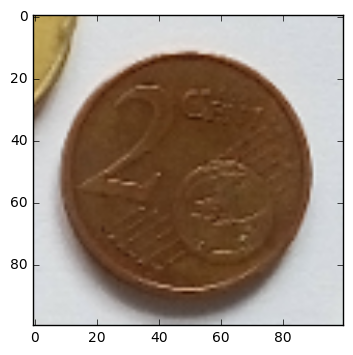

 0.00010071 of 1 cent 

 0.00017283 of 2 cent 

 0.97740072 of 5 cent 



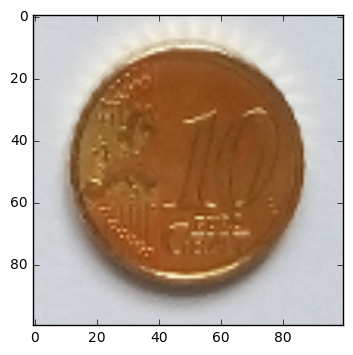

 0.00010306 of 1 cent 

 0.00017250 of 2 cent 

 0.97717035 of 5 cent 



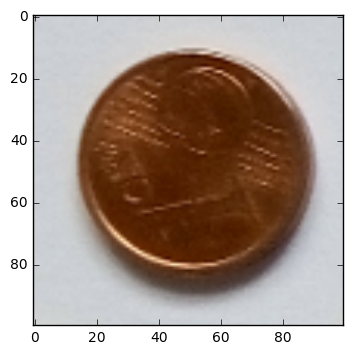

 0.00154279 of 1 cent 

 0.00012968 of 2 cent 

 0.96025926 of 5 cent 



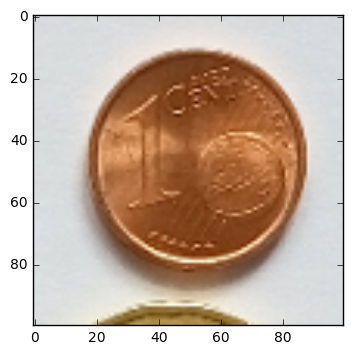

 0.00010361 of 1 cent 

 0.00017199 of 2 cent 

 0.97728002 of 5 cent 



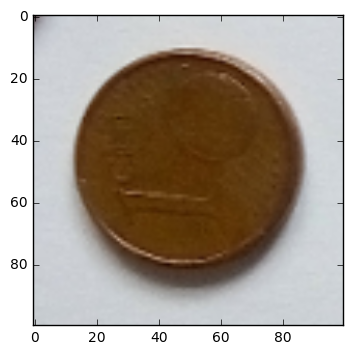

 0.00000009 of 1 euro 

 0.96852732 of 2 euro 



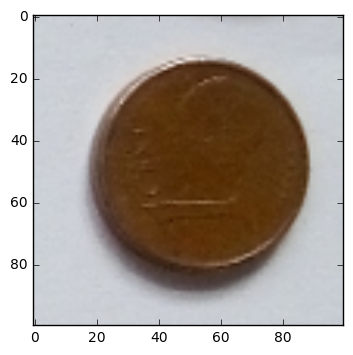

 0.02384720 of 1 cent 

 0.00006959 of 2 cent 

 0.92971587 of 5 cent 



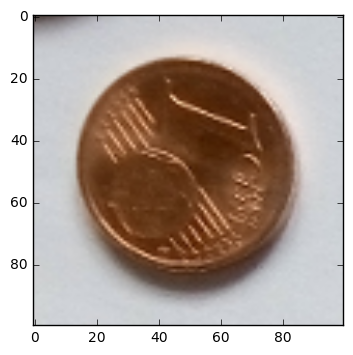

 0.00010046 of 1 cent 

 0.00017290 of 2 cent 

 0.97742051 of 5 cent 



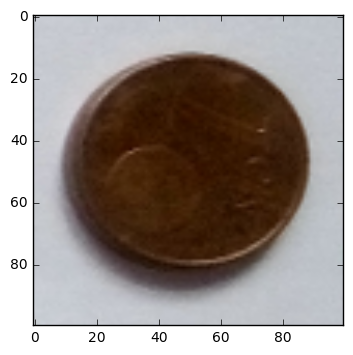

 0.00011684 of 1 cent 

 0.00016939 of 2 cent 

 0.97679543 of 5 cent 



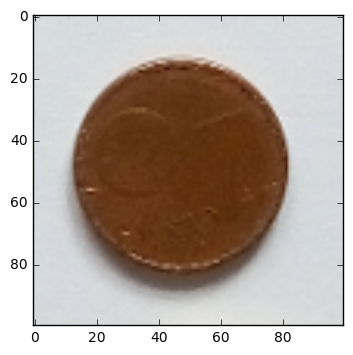

 Total money: 31.70 

Elapsed time: 27.347509 seconds.



In [5]:
#input_file = glob.glob(InputFolder+"*.jpg") #Try new Samples
input_file = [InputFolder+"P70216-161000.jpg"]  #For debugging
#input_file = [InputFolder+"P70210-173638.jpg"]  #For debugging

coinClassifier=LoadModel("Model_Example_Coin_Classifier_Standard")
coinClassifier.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])
coinClassifierBigCoins=LoadModel("Model_Example_Coin_Classifier_BigCoins_Standard")
coinClassifierBigCoins.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])
#coinClassifierGoldCoins=LoadModel("Model_Example_Coin_Classifier_GoldenCoins")
coinClassifierGoldCoins=LoadModel("Model_Example_Coin_Classifier_GoldenCoins_Deep_30p_dropout025")
coinClassifierGoldCoins.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])
#coinClassifierSmallCoins=LoadModel("Model_Example_Coin_Classifier_SmallCoins")
coinClassifierSmallCoins=LoadModel("Model_Example_Coin_Classifier_SmallCoins_Reduced")
coinClassifierSmallCoins.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])

ROWS = 100
COLS = 100

for kfile in input_file:
    tic()
    print("Analyzing input image "+str(kfile))
    #Getting the Circles
    im = Image.open(kfile)
    imarray = np.array(im)
    imgResized = cv2.resize(imarray, (int(imarray.shape[1]/3),int(imarray.shape[0]/3)), interpolation=cv2.INTER_CUBIC)
     
    circles = findCircles(imgResized)
    showInformation(drawCircles(imgResized, circles))
    candidates = showCandidates(imgResized, circles)
    
    #Saving output
    #saveCandidates(CoinsOutputFolder, kfile, candidates)
    #testCandidates = prep_data(candidates)
    money = 0.0
    
    for index, i in enumerate(candidates):
        #print index, i.shape
        imgResizedTest = cv2.resize(i, (ROWS, COLS), interpolation=cv2.INTER_CUBIC)
        imgResizedTest = [imgResizedTest for i in range(0,1)]
        imgResizedTest = np.array(imgResizedTest)
        predictedLabel = coinClassifier.predict(imgResizedTest)
        #print(" %.8f of big coin \n" % predictedLabel[0,0])
        #print(" %.8f of golden coin \n" % predictedLabel[0,1])
        #print(" %.8f of small coin \n" % predictedLabel[0,2])
        coinGroup = np.argmax(predictedLabel)
        
        if coinGroup == 0:
            predictedLabel = coinClassifierBigCoins.predict(imgResizedTest)
            print(" %.8f of 1 euro \n" % predictedLabel[0,0])
            print(" %.8f of 2 euro \n" % predictedLabel[0,1])
            coinType = np.argmax(predictedLabel)
            if coinType == 0:
                money += 1
            else:
                money += 2
        elif coinGroup == 1:
            predictedLabel = coinClassifierGoldCoins.predict(imgResizedTest)
            print(" %.8f of 10 cent \n" % predictedLabel[0,0])
            print(" %.8f of 20 cent \n" % predictedLabel[0,1])
            print(" %.8f of 50 cent \n" % predictedLabel[0,2])
            coinType = np.argmax(predictedLabel)
            if coinType == 0:
                money += 0.10
            elif coinType == 1:
                money += 0.20
            else:
                money += 0.50
        elif coinGroup == 2:
            predictedLabel = coinClassifierSmallCoins.predict(imgResizedTest)
            print(" %.8f of 1 cent \n" % predictedLabel[0,0])
            print(" %.8f of 2 cent \n" % predictedLabel[0,1])
            print(" %.8f of 5 cent \n" % predictedLabel[0,2])
            coinType = np.argmax(predictedLabel)
            if coinType == 0:
                money += 0.01
            elif coinType == 1:
                money += 0.02
            else:
                money += 0.05
        else:
            print("No coin detected")
        
        plt.imshow(Image.fromarray(imgResizedTest[0],'RGB'))
        plt.show()
    print(" Total money: %.2f \n" % money)
        
    #circles = findCircles(imgSubstracted)
    #showInformation(drawCircles(imgSubstracted, circles))
    #candidates = showCandidates(imgSubstracted, circles)
    
    
    #saveCircles(CirclesOutputFolder, kfile, drawCircles(imgResized, circles))
    toc()